# Homework 5

Michael Anderson

manderson113@student.gsu.edu

002485269

In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"]=20,20

from scipy import stats
# use seaborn plotting defaults
import seaborn as sns; sns.set()

%matplotlib inline

## 1

In [2]:
svm_data = pd.read_csv("data/svm.csv")

In [3]:
# this crashed every time I ran it
# but it worked long enough to see that all values are numeric,
# there are no missing values,
# and that the data needs to be normalized
# svm_data.profile_report()

In [4]:
svm_columns = svm_data.columns
svm_features = ['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension']
svm_target = 'target'

In [5]:
min_max_scaler = preprocessing.MinMaxScaler()
svm_data_clean = pd.DataFrame(data=min_max_scaler.fit_transform(svm_data.values), columns=svm_data.columns)

### a)

 0: mean radius
 1: mean texture
 2: mean perimeter
 3: mean area
 4: mean smoothness
 5: mean compactness
 6: mean concavity
 7: mean concave points
 8: mean symmetry
 9: mean fractal dimension
10: radius error
11: texture error
12: perimeter error
13: area error
14: smoothness error
15: compactness error
16: concavity error
17: concave points error
18: symmetry error
19: fractal dimension error
20: worst radius
21: worst texture
22: worst perimeter
23: worst area
24: worst smoothness
25: worst compactness
26: worst concavity
27: worst concave points
28: worst symmetry
29: worst fractal dimension
30: target


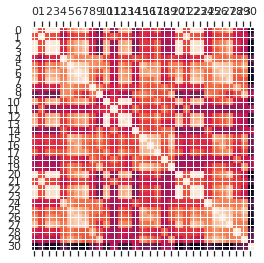

<Figure size 1000x1000 with 0 Axes>

In [11]:
plt.matshow(svm_data.corr())
plt.xticks(np.arange(len(svm_columns)))
plt.yticks(np.arange(len(svm_columns)))
fig = plt.figure(figsize=(10, 10), dpi=100)
fig.show()
for i, v in enumerate(svm_columns):
    print(f"{i:-2}: {v}")

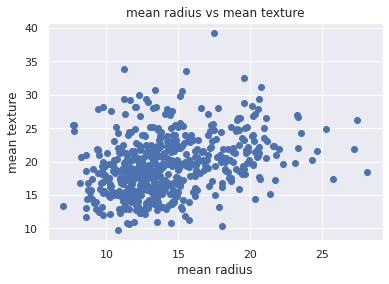

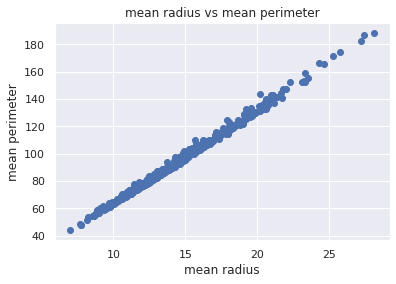

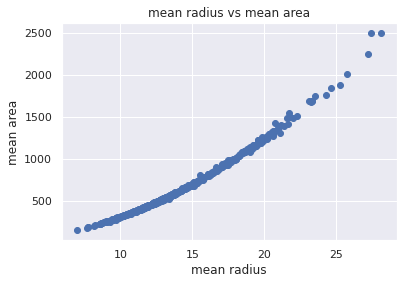

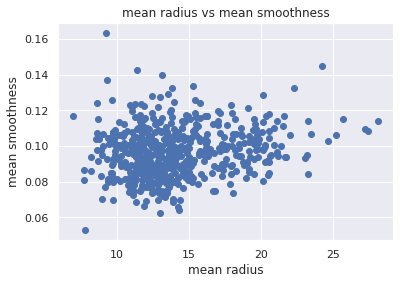

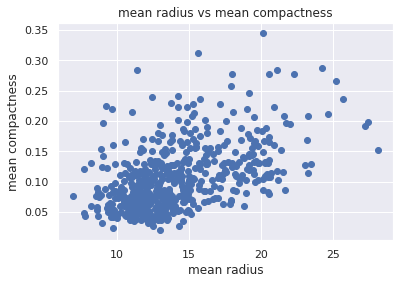

...

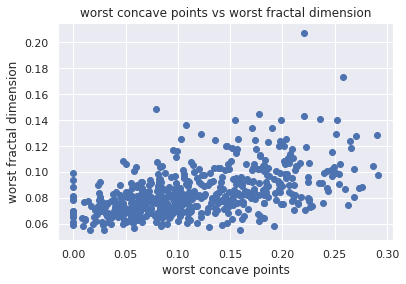

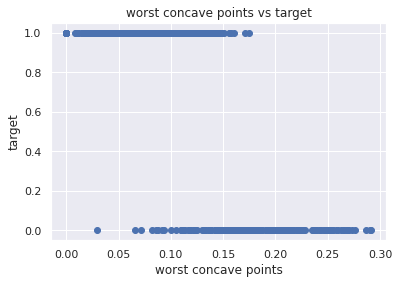

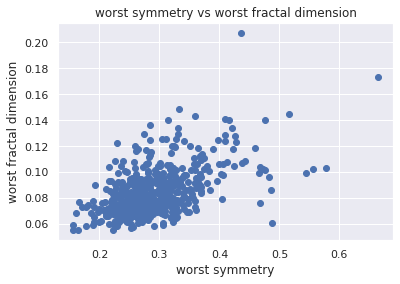

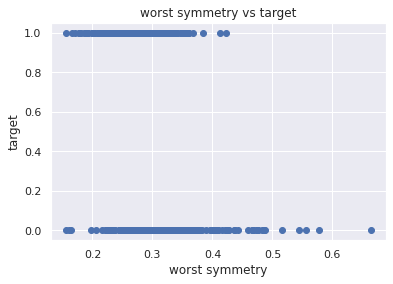

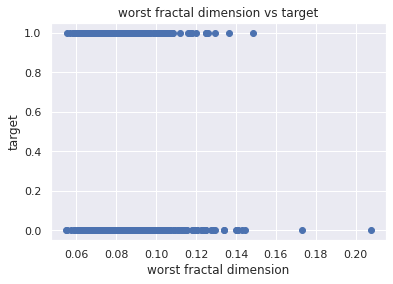

In [7]:
for x_index, x_feature in enumerate(svm_columns):
    for y_index, y_feature in enumerate(svm_columns):
        if x_index < y_index:
            plt.scatter(svm_data[x_feature].values, svm_data[y_feature].values)
            plt.title(f"{x_feature} vs {y_feature}")
            plt.xlabel(x_feature)
            plt.ylabel(y_feature)
            plt.show()

### b)

In [9]:
from sklearn.model_selection import train_test_split
linear_train_x, linear_test_x, linear_train_y, linear_test_y = train_test_split(svm_data_clean[svm_features], svm_data_clean[svm_target], train_size=0.3)

                     Training Set
Accuracy Score:  0.9941176470588236
[[ 64   1]
 [  0 105]]
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99        65
         1.0       0.99      1.00      1.00       105

    accuracy                           0.99       170
   macro avg       1.00      0.99      0.99       170
weighted avg       0.99      0.99      0.99       170



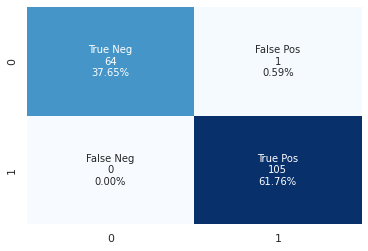

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
                     Test Set
Accuracy Score:  0.9598997493734336
[[131  16]
 [  0 252]]
              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94       147
         1.0       0.94      1.00      0.97       252

    accuracy                           0.96       399
   macro avg       0.97      0.95      0.96       399
weighted avg       0.96      0.96      0.96       399



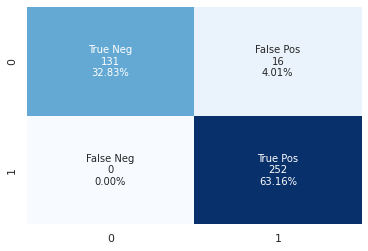

In [22]:
from sklearn.svm import LinearSVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
lsvc = LinearSVC()
lsvc.fit(linear_train_x, linear_train_y)

def score_result(description, x, y):
    print(" "*20,description)
    score = lsvc.score(x, y)
    print("Accuracy Score: ", score)
    predicted = lsvc.predict(x)
    cm = confusion_matrix(y, predicted)
    print(cm)
    report = classification_report(y, predicted)
    print(report)
    group_names = ["True Neg","False Pos","False Neg","True Pos"]
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm, annot=labels, fmt="", cmap='Blues', cbar=False)
    plt.show()
    
score_result("Training Set", linear_train_x, linear_train_y)
print("~"*60)
score_result("Test Set", linear_test_x, linear_test_y)

### c)

### d)

### e)

## 2

### a)

### b)